# Basic figures

**Pinned Environment:** [`envs/sc-scvi.yaml`](../../envs/sc-scvi.yaml)  

In [1]:
from pathlib import Path
import sys
import os
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
# plot formatting

plt.rcParams['figure.figsize'] = (3,3)
plt.rcParams["figure.dpi"] = 300

# make text editable as words in output plots
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

### Setup

In [3]:
sys.path.append(str(Path.cwd().resolve().parents[1]))

from config.paths import BASE_DIR

# Output directories
output_dir = BASE_DIR / "figures"
output_dir.mkdir(parents=True, exist_ok=True)

plot_out_dir = output_dir / "plots"
plot_out_dir.mkdir(parents=True, exist_ok=True)

# Data input paths
# neuron adata with final labels
adata_neurons_path = BASE_DIR / "data/h5ad/export_04/04c_gamma_subtypes/neurons-final-labels.h5ad"
# global adata
adata_merged_labels_path = BASE_DIR / "data/h5ad/export_03/03b_seurat/adata-merged-labels.h5ad"

# Reporter status table
reporters_path = BASE_DIR / "data/h5ad/export_03/03b_thresholds/reporter_classes_gaussian_thresholds.csv"


## Load adata

In [4]:
# global labeled
adata_merged_labels = sc.read_h5ad(adata_merged_labels_path)
# neurons
adata = sc.read_h5ad(adata_neurons_path)

## Plotting functions

In [5]:
import matplotlib.colors as mcolors

def plot_umaps(
    adata,
    label_cols,
    true_color_map,
    false_color,
    true_size,
    false_size,
    linewidth,
    alpha_false,
    figsize=(3, 3),
    save_path = None
):
    """
    Plot minimalist UMAPs for boolean label columns.
    Transparent color fill with a solid black outline.
    """

    if "X_umap" not in adata.obsm:
        raise ValueError("No UMAP found in adata.obsm['X_umap'].")

    x, y = adata.obsm["X_umap"][:, 0], adata.obsm["X_umap"][:, 1]

    for col in label_cols:
        if col not in adata.obs.columns:
            print(f"Column `{col}` not in adata.obs — skipping.")
            continue

        # --- COLOR LOGIC ---
        base_color = true_color_map[col]
        # Convert the map color (e.g. 'limegreen') to RGBA with 0.5 alpha for the fill
        rgb = mcolors.to_rgb(base_color)
        face_rgba = (*rgb, 0.5) 
        
        # Explicitly set the outline to solid black
        edge_rgba = (0.0, 0.0, 0.0, 1.0) 
        # -------------------

        mask = adata.obs[col].astype(bool).values

        plt.figure(figsize=figsize)

        # Plot FALSE background (unlabeled cells)
        plt.scatter(
            x[~mask],
            y[~mask],
            s=false_size,
            c=false_color,
            linewidths=0,
            alpha=alpha_false,
        )

        # Plot TRUE foreground (labeled cells)
        plt.scatter(
            x[mask],
            y[mask],
            s=true_size,
            facecolors=face_rgba, 
            edgecolors=edge_rgba, 
            linewidths=linewidth,
            # alpha is omitted to prevent overriding the RGBA settings
        )

        ax = plt.gca()
        ax.set_aspect("equal", "box")
        ax.axis("off") 

        plt.tight_layout()

        if save_path is not None:
            plt.savefig(os.path.join(save_path, f"umap_{col}.pdf"), format='pdf', bbox_inches='tight')

        plt.show()

In [6]:
def barplot_dual_distribution(
    adata,
    population_name,
    group_col="neuron_label",
    label_col="EGFP_dTomato_dual_hi",
    bar_color="black",
    figsize=(4, 4),
    fontsize=11,
    plot_counts = True,
    return_group_order=False,
    group_order=None,
):
    """
    Plot bar chart of reporter-positive cell distribution across cell type groups.

    Parameters
    ----------
    adata : AnnData
        Annotated data object.
    population_name : str
        Label for the reporter population (e.g., 'Double+', 'EGFP+').
    group_col : str
        Column in adata.obs containing cell type groups.
    label_col : str
        Column in adata.obs containing boolean reporter status.
    plot_counts : bool
        If True, plot counts; if False, plot percentages.
    group_order : list or None
        Custom group order; if None, sorts by descending percentage.
    return_group_order : bool
        If True, returns (fig, final_order); otherwise returns fig only.
    """
    df = adata.obs[[group_col, label_col]].copy()
    df[label_col] = df[label_col].astype(bool)
    df[group_col] = df[group_col].astype(str).replace("nan", "Unknown")

    # Count dual positives per group (correct)
    dual_counts = df.groupby(group_col)[label_col].sum()

    total_dual = dual_counts.sum()
    print('number +: ', total_dual)

    # percentage
    stats = (dual_counts / total_dual * 100).sort_values(ascending=False)

    if group_order is not None:
        # Use the provided order. .reindex ensures we handle missing/extra groups safely.
        # Fill missing groups with 0 so the bars show up as empty instead of crashing.
        stats = stats.reindex(group_order).fillna(0)
    else:
        # Default: Sort by percentage descending
        stats = stats.sort_values(ascending=False)

    print(f"Percentages sum to: {stats.sum():.2f}")

    # Final order of categories
    final_order = stats.index.tolist()
    sorted_counts = dual_counts.reindex(final_order).fillna(0)

    fig, ax = plt.subplots(figsize=figsize)

    x = np.arange(len(stats))
    if plot_counts:
        ax.bar(x, sorted_counts.values, color=bar_color, alpha=0.9)
    else:
        ax.bar(x, stats.values, color=bar_color, alpha=0.9)

    # xticks
    ax.set_xticks(x)
    ax.set_xticklabels(stats.index, rotation=45, ha="right", fontsize=fontsize)

    # y-axis
    if plot_counts:
        ax.set_ylabel("Count", fontsize=fontsize)
    else:
        ax.set_ylim(0, 100)  # <-- force axis to show full 0–100%
        ax.set_ylabel(f"% of {population_name} \nneurons", fontsize=fontsize)
    ax.set_xlabel("")

    # minimalist styling
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="y", length=0)
    ax.tick_params(axis="x", length=0)

    plt.subplots_adjust(bottom=0.28)
    if return_group_order:
        return fig, final_order

## Add and view reporter status 

In [7]:
reporter_classes_updated_dual = pd.read_csv(reporters_path, index_col = 0)

cols_update = ['EGFP_Seq1_hi', 'dTomato_Seq2_hi', 'EGFP_dTomato_dual_hi', 'reporter_status']
for col in cols_update:
    if col in adata.obs.columns:
        del adata.obs[col]

# add individual reporter columns
adata.obs = adata.obs.join(reporter_classes_updated_dual[['EGFP_Seq1_hi', 'dTomato_Seq2_hi', 'EGFP_dTomato_dual_hi', 'reporter_status']])

In [8]:
# Show single+ all together
counts_series = adata.obs.value_counts(['EGFP_Seq1_hi', 'dTomato_Seq2_hi', 'EGFP_dTomato_dual_hi'])
counts_df = counts_series.reset_index(name='cell_count')
counts_df

,EGFP_Seq1_hi,dTomato_Seq2_hi,EGFP_dTomato_dual_hi,cell_count
0,False,False,False,22120
1,True,False,False,139
2,False,True,False,133
3,True,True,True,19


In [9]:
# show distributions of reporter + cells
group_col = 'neuron_label'
labels = ["EGFP_Seq1_hi", "dTomato_Seq2_hi", "EGFP_dTomato_dual_hi"]
for label_col in labels:
    # output
    df = adata.obs[[group_col, label_col]].copy()
    df[label_col] = df[label_col].astype(bool)
    df[group_col] = df[group_col].astype(str).replace("nan", "Unknown")

    # Count dual positives per group (correct)
    dual_counts = df.groupby(group_col)[label_col].sum()

    total_dual = dual_counts.sum()
    print('number +: ', total_dual)

    # percentage
    stats = (dual_counts / total_dual * 100).sort_values(ascending=False)

    count_percent_df = pd.concat([dual_counts, stats], axis=1)
    count_percent_df.columns = ['count', 'percent']
    count_percent_df = count_percent_df.sort_values(by='percent', ascending=False)
    print(count_percent_df)

number +:  158
                            count    percent
neuron_label                                
CGRP-Gamma 2                   88  55.696203
CGRP-Gamma 1                   31  19.620253
CGRP-Zeta                      14   8.860759
CGRP-Eta                       10   6.329114
CGRP-Epsilion                   4   2.531646
Adelta-LTMR                     3   1.898734
Abeta-Field                     2   1.265823
Abeta-RA-LTMR                   2   1.265823
C-LTMR                          1   0.632911
Nonpeptidergic nociceptors      1   0.632911
Proprioceptors                  1   0.632911
TrpM8                           1   0.632911
CGRP-Alpha                      0   0.000000
CGRP-Beta                       0   0.000000
CGRP-Theta                      0   0.000000
Sst                             0   0.000000
number +:  152
                            count    percent
neuron_label                                
CGRP-Gamma 2                  121  79.605263
CGRP-Gamma 1             

## Neuron vs non-neuron fraction
Starting with global adata object

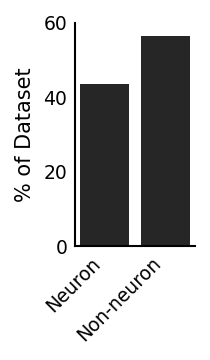

In [10]:
# plot neuron vs non-neuron fraction

# Count total and neuron fraction
counts = adata_merged_labels.obs["seurat_class"].value_counts()

neuron_count = counts.get("Neuron", 0)
total = counts.sum()
non_neuron_count = total - neuron_count

# Percentages
labels = ["Neuron", "Non-neuron"]
values = [(neuron_count / total) * 100,
          (non_neuron_count / total) * 100]

# --- Minimal plot ---
plt.figure(figsize=(1.5, 2.5), dpi=150)
plt.bar(labels, values, color=["black", "black"], alpha=0.85)   # <-- both gray

# Style: minimalist
plt.ylim(0, 60)
plt.ylabel("% of Dataset", fontsize=10)
plt.xlabel("")
plt.xticks(rotation=45, ha='right', fontsize=9)   # <-- rotated x labels
plt.yticks(fontsize=9)

# Only bottom & left spine
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)

# No tick marks
ax.tick_params(axis='y', length=0)
ax.tick_params(axis='x', length=0)

plt.tight_layout()
plt.savefig(os.path.join(plot_out_dir, "neuron_non-neuron_fraction.pdf"), format='pdf', bbox_inches='tight')

## Neuron Umaps

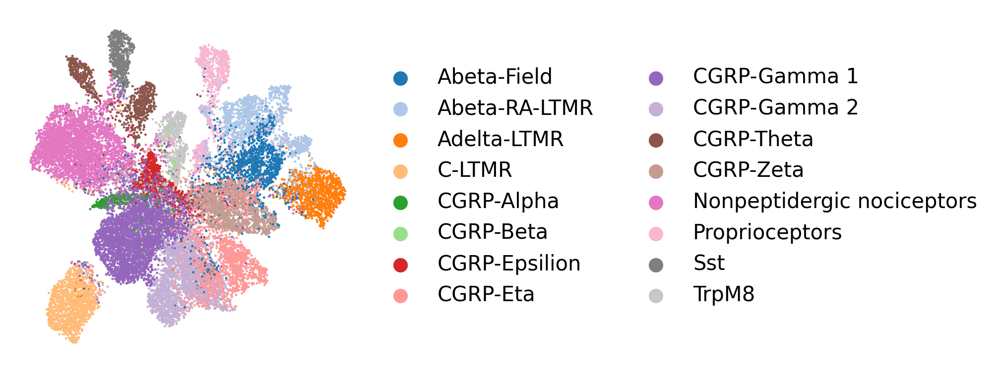

In [11]:
# plot neuron label umap
sc.pl.embedding(adata, basis = 'X_umap', color = 'neuron_label', title = '', frameon=False, show = False)
plt.savefig(os.path.join(plot_out_dir, "umap_neuron_label.pdf"), format='pdf', bbox_inches='tight')

In [12]:
# save neuron label palette: get color palette from xenium umap 
neuron_label_palette_mapped = dict(zip(
    adata.obs['neuron_label'].cat.categories,
    adata.uns['neuron_label_colors']
))

## Save palette
import pickle
with open(os.path.join(output_dir, 'neuron_label_palette_mapped.pkl'), 'wb') as f:
    pickle.dump(neuron_label_palette_mapped, f)

#### Plot umaps with reporter labels

In [13]:
labels = ["EGFP_Seq1_hi", "dTomato_Seq2_hi", "EGFP_dTomato_dual_hi"]

true_color_map = {
    "EGFP_Seq1_hi": "#48B226", # "limegreen",
    "dTomato_Seq2_hi": "#953F88", # "magenta",
    "EGFP_dTomato_dual_hi": "blue", # "blue" # 
}

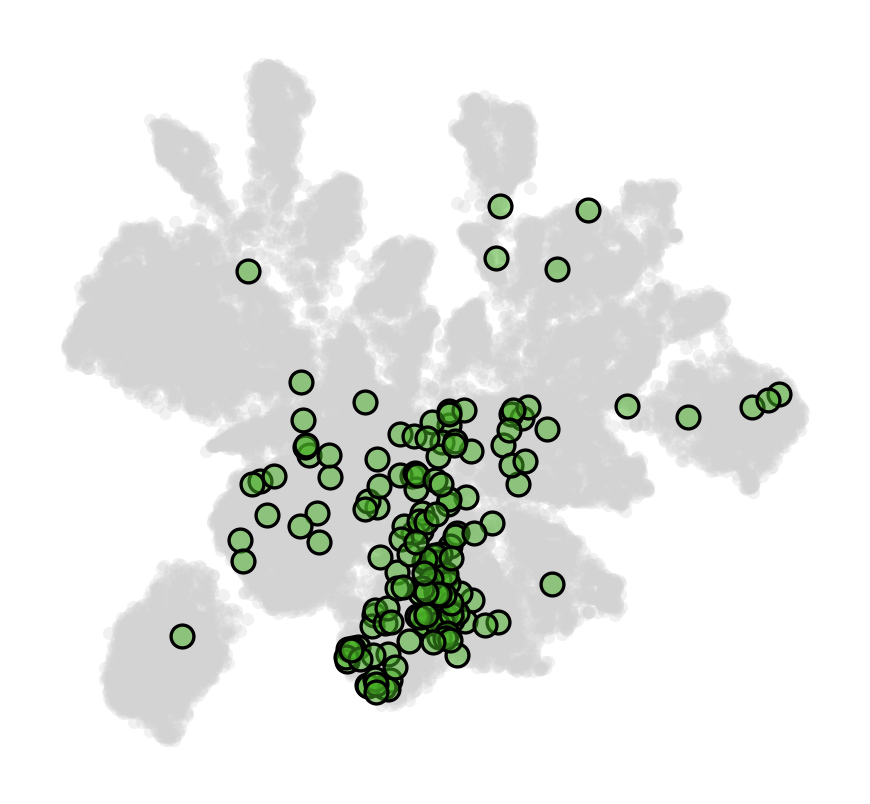

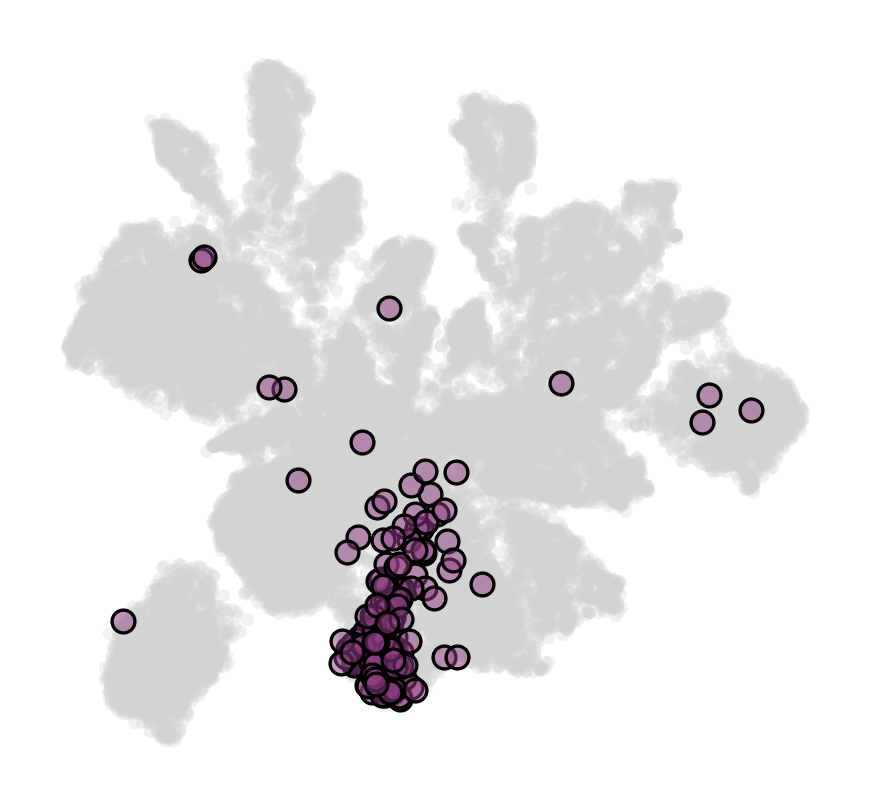

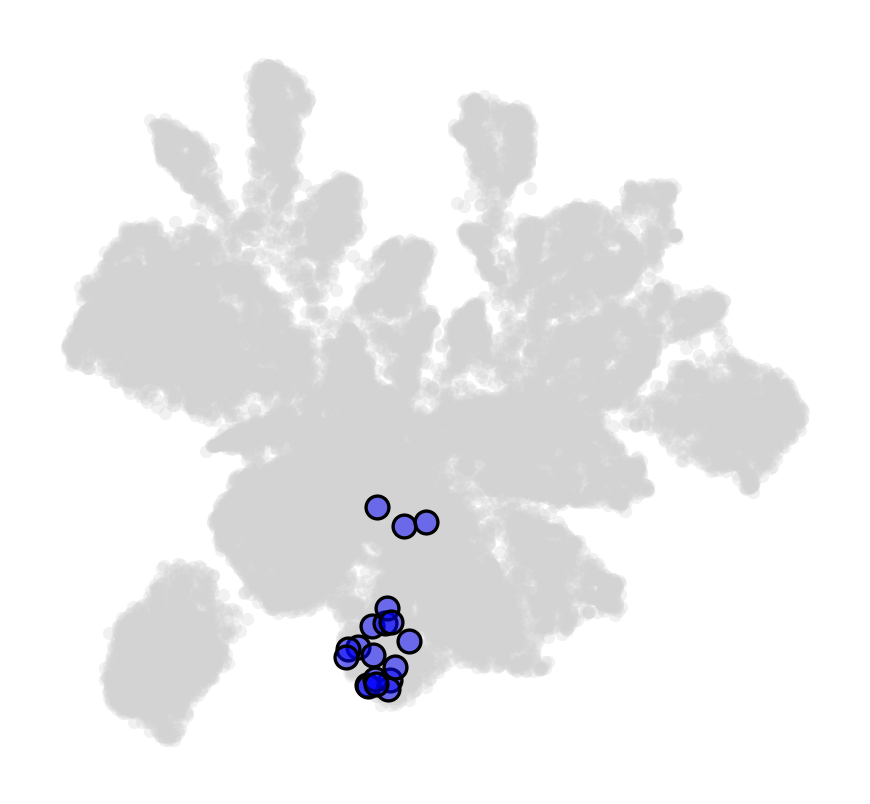

In [14]:
# alpha_false controls the transparency of non-highlighted (reporter-negative) cells
plot_umaps(
    adata,
    label_cols=labels,
    true_color_map=true_color_map,
    false_color="lightgray",
    true_size=30,
    false_size=10,
    linewidth=0.8,
    alpha_false=0.3,
    save_path = plot_out_dir
)

## Visualization of reporter status

### Export reporter status counts as csv
1. Counts of reporter positive cells where the EGFP+ and dTomato+ counts are not single positive (e.g. they include that dual+ cells)
2. Counts of reporter positive cells where the EGFP+ and dTomato+ counts are single positive
3. For each of these 2 options, generate the table first with counts separated by cell type and then collapsed to combine all cell types

### Csvs for single positives
Use, 'reporter status' column, which already contains single+ and dual+

In [15]:
# counts by neuron label
combined_counts = adata.obs.value_counts(['neuron_label', 'reporter_status'])

combined_df = combined_counts.reset_index(name='cell_count')

# Sort for better readability (Group by neuron, then descending count)
combined_df = combined_df.sort_values(['neuron_label', 'cell_count'], ascending=[True, False])

# now collapse cell types
combined_df_collapse = combined_df.groupby('reporter_status', observed=True)['cell_count'].sum().reset_index().sort_values(by='cell_count', ascending=False)

# Export
combined_df.to_csv(os.path.join(output_dir, 'neuron_label_reporter_status_single_positive.csv'), index=False)
combined_df_collapse.to_csv(os.path.join(output_dir, 'all_neurons_reporter_status_single_positive.csv'), index=False)

In [16]:
combined_df_collapse

,reporter_status,cell_count
2,Negative,22120
0,EGFP_Seq1_hi,139
3,dTomato_Seq2_hi,133
1,EGFP_dTomato_dual_hi,19


In [17]:
combined_df.head(20)

,neuron_label,reporter_status,cell_count
6,Abeta-Field,Negative,1449
29,Abeta-Field,EGFP_Seq1_hi,2
37,Abeta-Field,dTomato_Seq2_hi,1
5,Abeta-RA-LTMR,Negative,1461
28,Abeta-RA-LTMR,EGFP_Seq1_hi,2
8,Adelta-LTMR,Negative,1013
25,Adelta-LTMR,dTomato_Seq2_hi,4
26,Adelta-LTMR,EGFP_Seq1_hi,3
7,C-LTMR,Negative,1400
30,C-LTMR,dTomato_Seq2_hi,1


### Csvs for all reporter positives (not requiring single positive)

Use the individual reporter True/False columns for counting

In [18]:
# counts by neuron label
single_reporter_cols = ['EGFP_Seq1_hi', 'dTomato_Seq2_hi', 'EGFP_dTomato_dual_hi']
combined_counts = adata.obs.groupby('neuron_label', observed=True)[single_reporter_cols].sum()
is_negative = adata.obs[single_reporter_cols].sum(axis=1) == 0
combined_counts['Negative'] = adata.obs[is_negative].groupby('neuron_label', observed=True).size()

# Reshape from wide to long format
combined_df = combined_counts.reset_index().melt(
    id_vars='neuron_label', var_name='reporter_status', value_name='cell_count'
)

# sort
combined_df = combined_df.sort_values(['neuron_label', 'cell_count'], ascending=[True, False])

# now collapse cell types
combined_df_collapse = combined_df.groupby('reporter_status', observed=True)['cell_count'].sum().reset_index().sort_values(by='cell_count', ascending=False)

# Export
combined_df.to_csv(os.path.join(output_dir, 'neuron_label_reporter_status_not_single_positive.csv'), index=False)
combined_df_collapse.to_csv(os.path.join(output_dir, 'all_neurons_reporter_status_not_single_positive.csv'), index=False)

In [19]:
combined_df_collapse

,reporter_status,cell_count
2,Negative,22120
0,EGFP_Seq1_hi,158
3,dTomato_Seq2_hi,152
1,EGFP_dTomato_dual_hi,19


In [20]:
combined_df.head()

,neuron_label,reporter_status,cell_count
48,Abeta-Field,Negative,1449
0,Abeta-Field,EGFP_Seq1_hi,2
16,Abeta-Field,dTomato_Seq2_hi,1
32,Abeta-Field,EGFP_dTomato_dual_hi,0
49,Abeta-RA-LTMR,Negative,1461


### Plot reporter status barplots

### Counts - showing reporter+ (not necessarily single positive)

number +:  19
Percentages sum to: 100.00
number +:  158
Percentages sum to: 100.00
number +:  152
Percentages sum to: 100.00


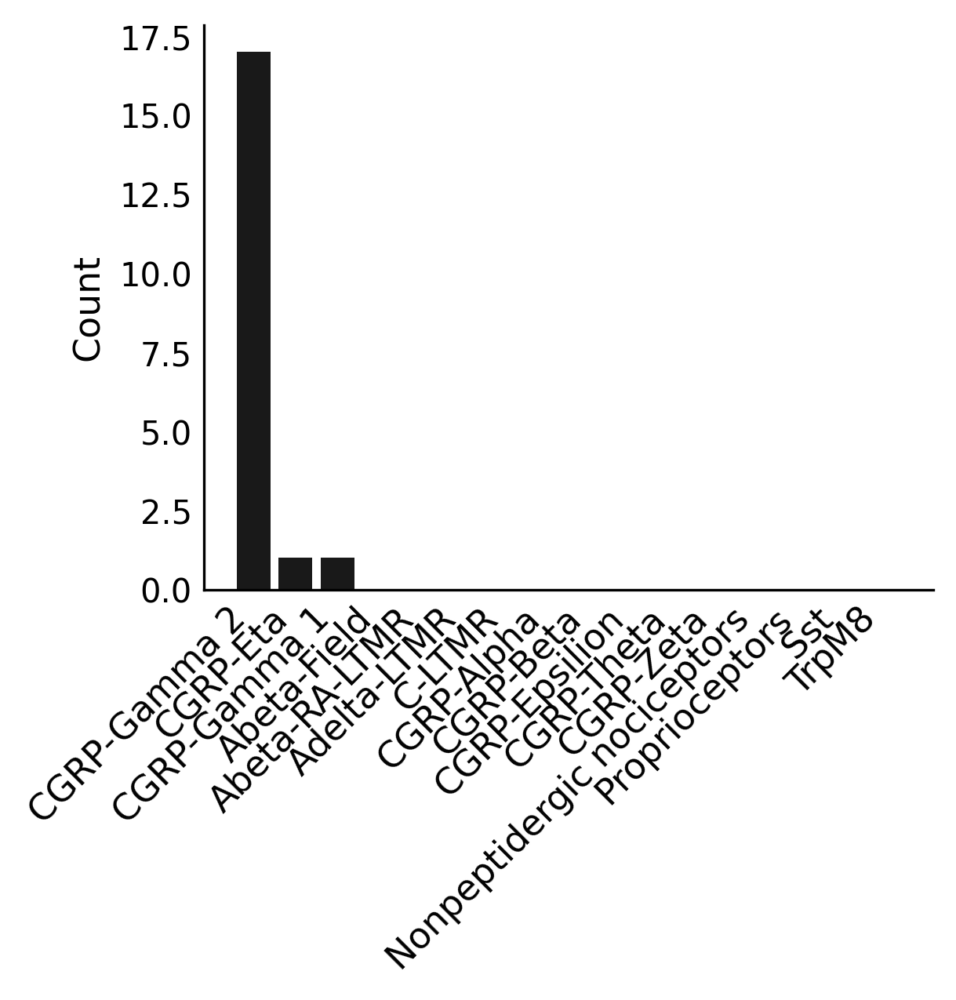

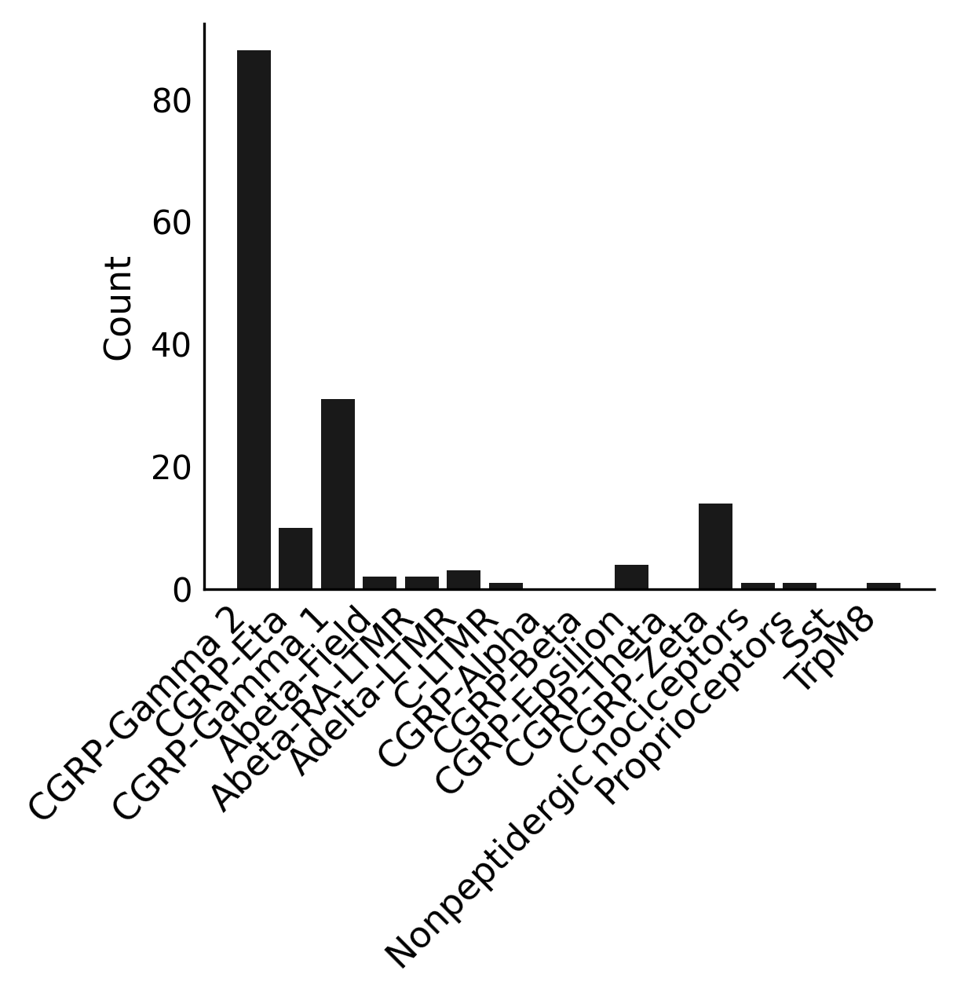

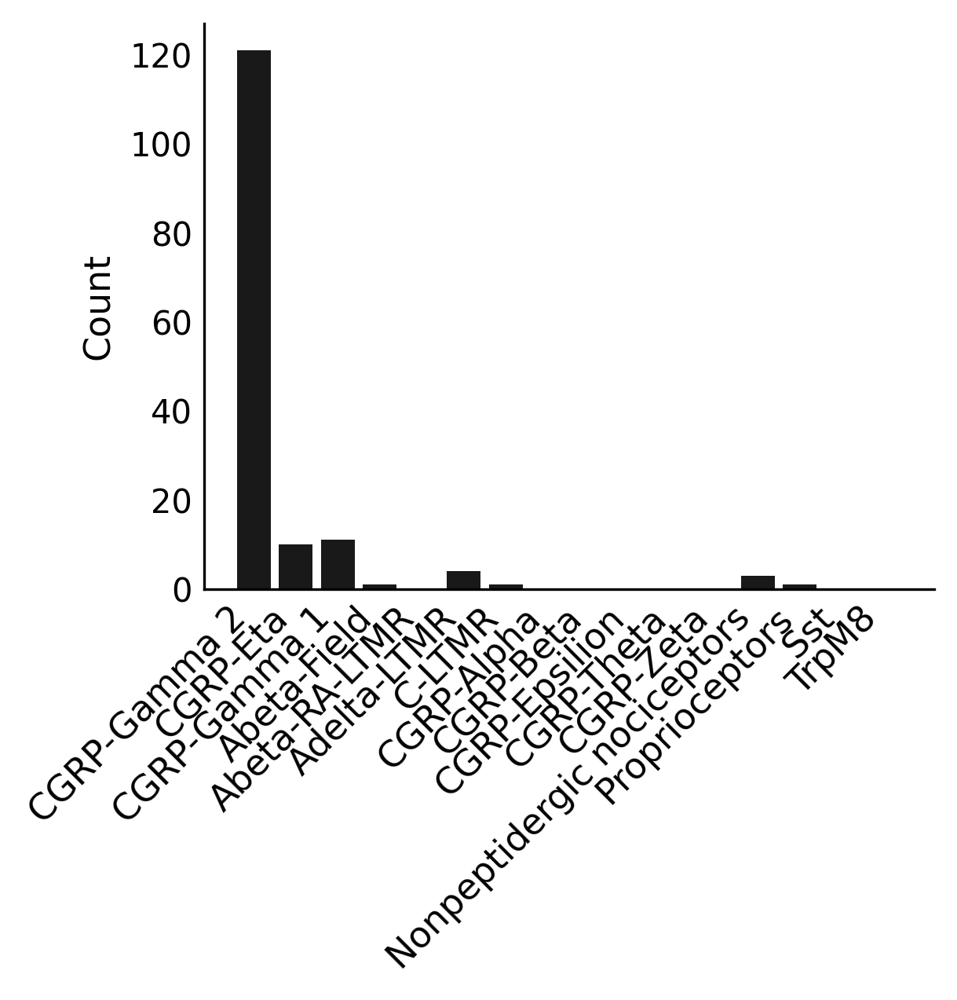

In [21]:
# set cell type order based on dual positive order
_, dual_order = barplot_dual_distribution(adata, population_name = 'Double+',
                                          label_col="EGFP_dTomato_dual_hi",
                          return_group_order=True,
                            group_order=None)   
plt.savefig(os.path.join(plot_out_dir, "dual_distribution_count.pdf"), format='pdf', bbox_inches='tight')

barplot_dual_distribution(adata,population_name = 'EGFP+',
                          label_col="EGFP_Seq1_hi",
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "EGFP_distribution_count.pdf"), format='pdf', bbox_inches='tight')

barplot_dual_distribution(adata,population_name = 'dTomato+',
                          label_col="dTomato_Seq2_hi",
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "dTomato_distribution_count.pdf"), format='pdf', bbox_inches='tight')



### Counts - showing single positive only for each single reporter

number +:  139
Percentages sum to: 100.00
number +:  133
Percentages sum to: 100.00


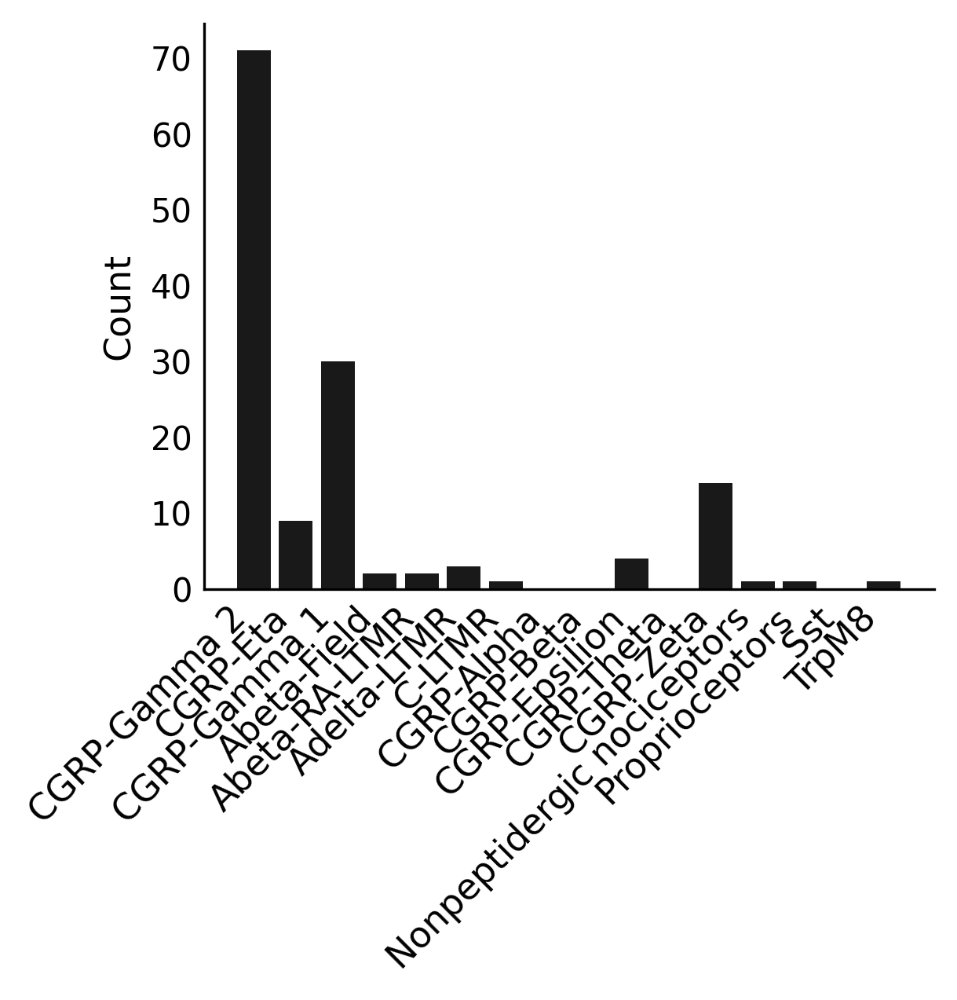

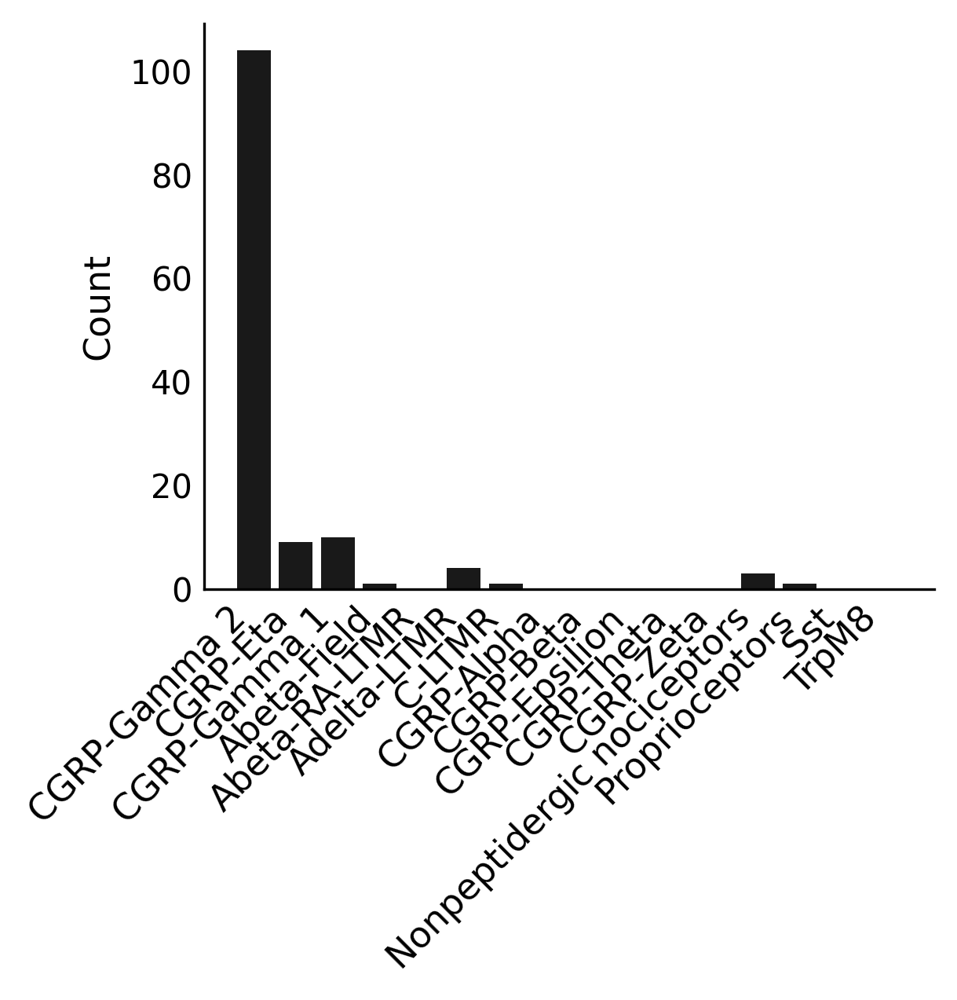

In [22]:
# set cell type order based on dual positive order

# make new temporary column 
tmp = adata.copy()
tmp.obs['EGFP_single_positive'] = False
tmp.obs['dTomato_single_positive'] = False
tmp.obs.loc[tmp.obs['reporter_status']=='EGFP_Seq1_hi', 'EGFP_single_positive'] = True
tmp.obs.loc[tmp.obs['reporter_status']=='dTomato_Seq2_hi', 'dTomato_single_positive'] = True

barplot_dual_distribution(tmp,population_name = 'EGFP+',
                          label_col="EGFP_single_positive",
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "EGFP_distribution_count_single_positive.pdf"), format='pdf', bbox_inches='tight')

barplot_dual_distribution(tmp,population_name = 'dTomato+',
                          label_col="dTomato_single_positive",
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "dTomato_distribution_count_single_positive.pdf"), format='pdf', bbox_inches='tight')



### Percent - showing reporter+ (not single positive)

number +:  19
Percentages sum to: 100.00
number +:  158
Percentages sum to: 100.00
number +:  152
Percentages sum to: 100.00


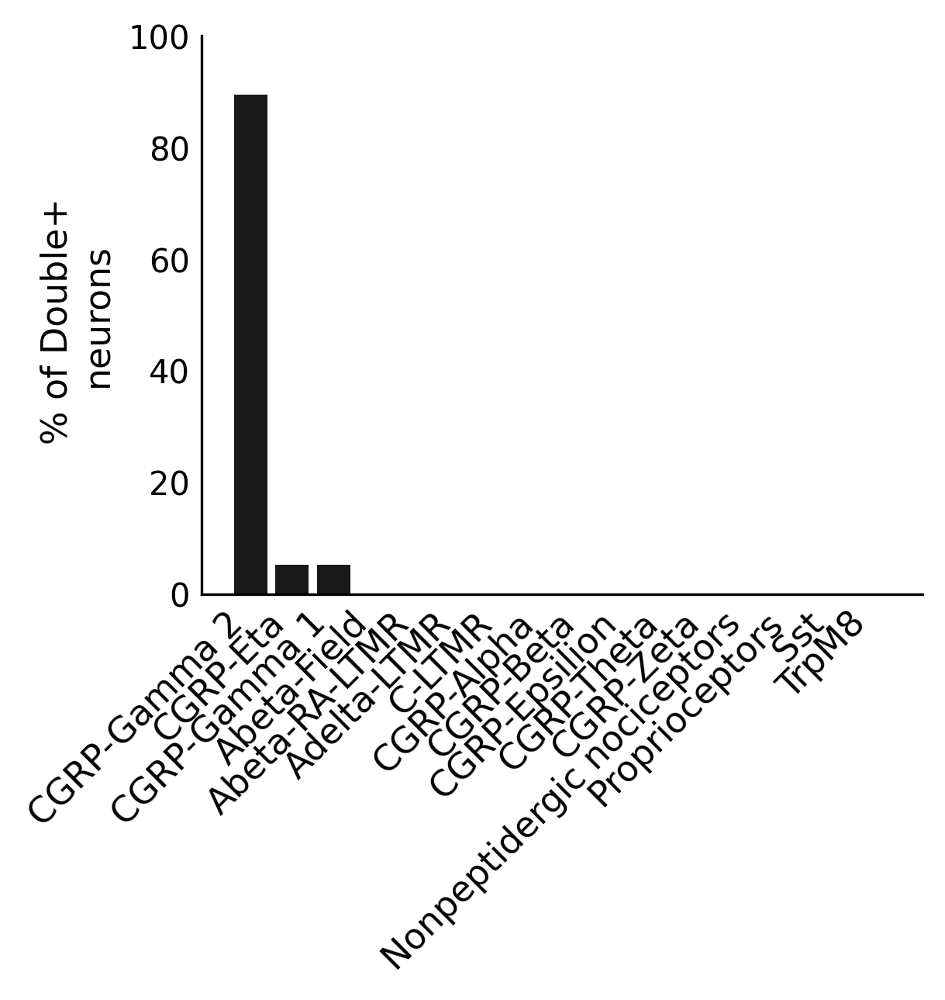

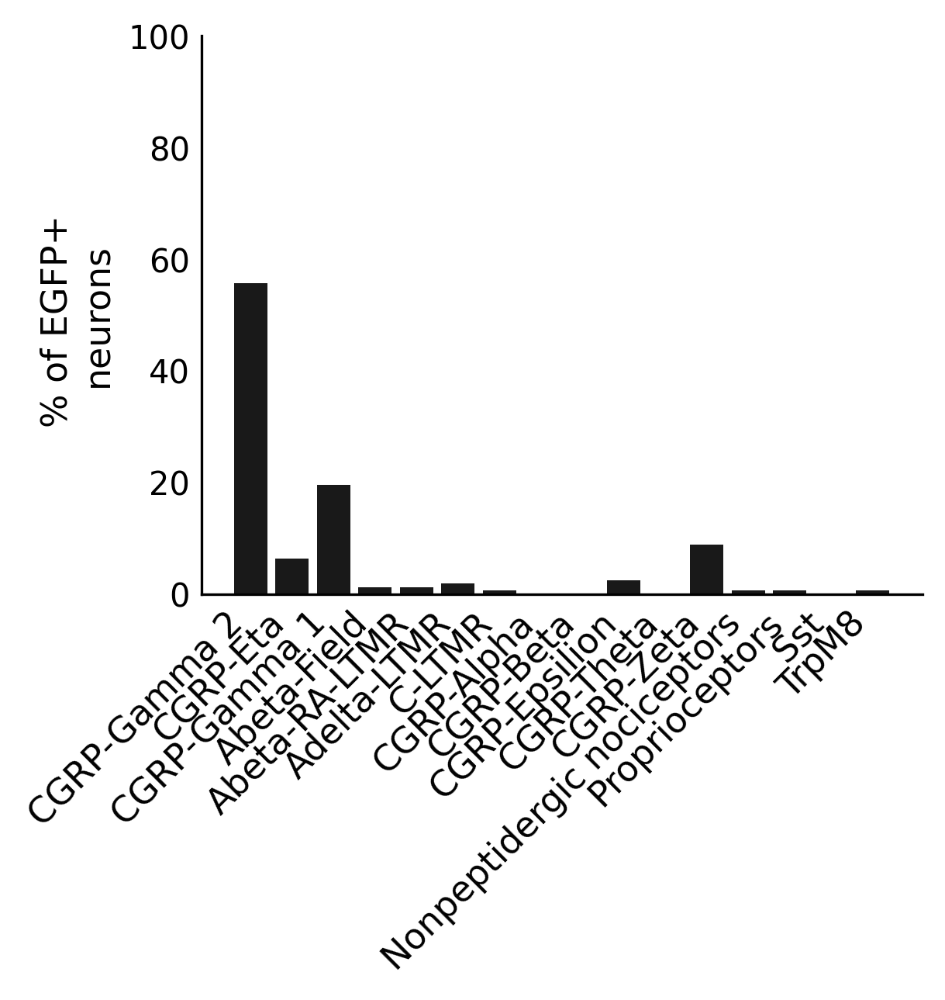

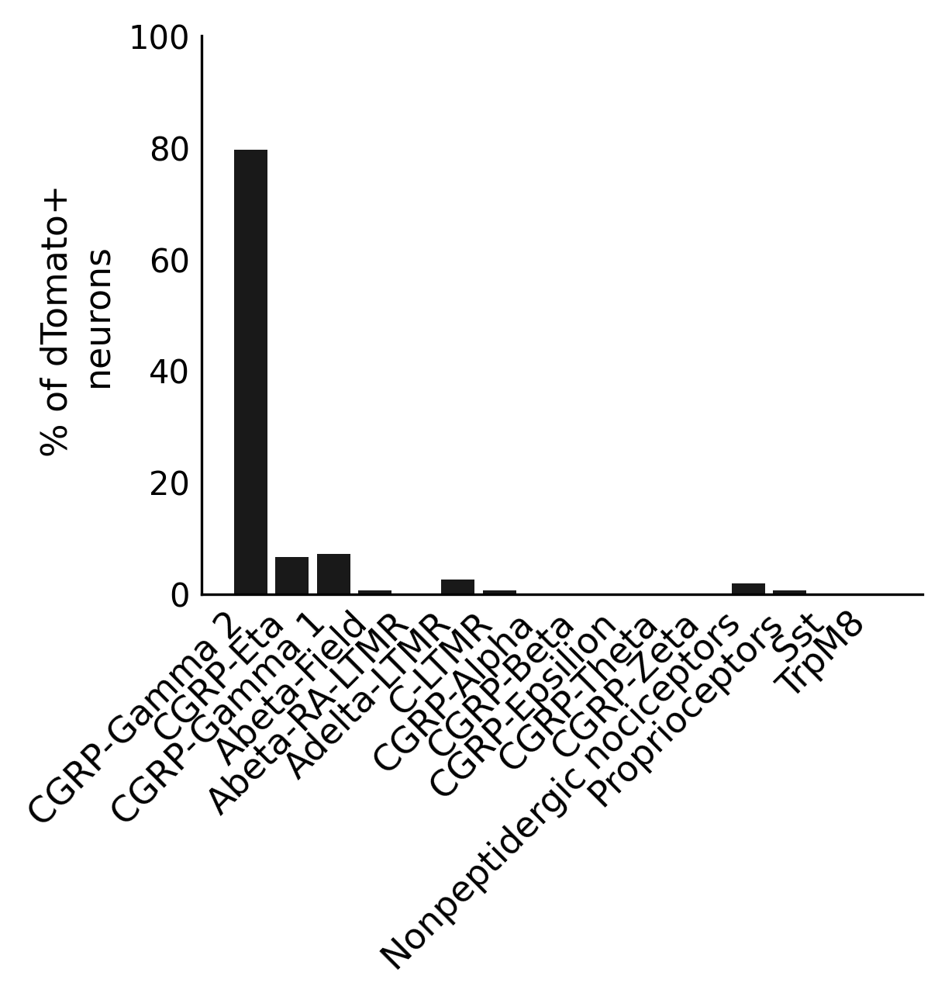

In [23]:
# use cell label ordering from dual+ counts plot above
barplot_dual_distribution(adata, population_name = 'Double+',
                          label_col="EGFP_dTomato_dual_hi", plot_counts = False,
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "dual_distribution_percent.pdf"), format='pdf', bbox_inches='tight')

barplot_dual_distribution(adata, population_name = 'EGFP+', 
                          label_col="EGFP_Seq1_hi", plot_counts = False,
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "EGFP_distribution_percent.pdf"), format='pdf', bbox_inches='tight')

barplot_dual_distribution(adata, population_name = 'dTomato+', 
                          label_col="dTomato_Seq2_hi", plot_counts = False,
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "dTomato_distribution_percent.pdf"), format='pdf', bbox_inches='tight')

### Percent - showing single positive only

number +:  139
Percentages sum to: 100.00
number +:  133
Percentages sum to: 100.00


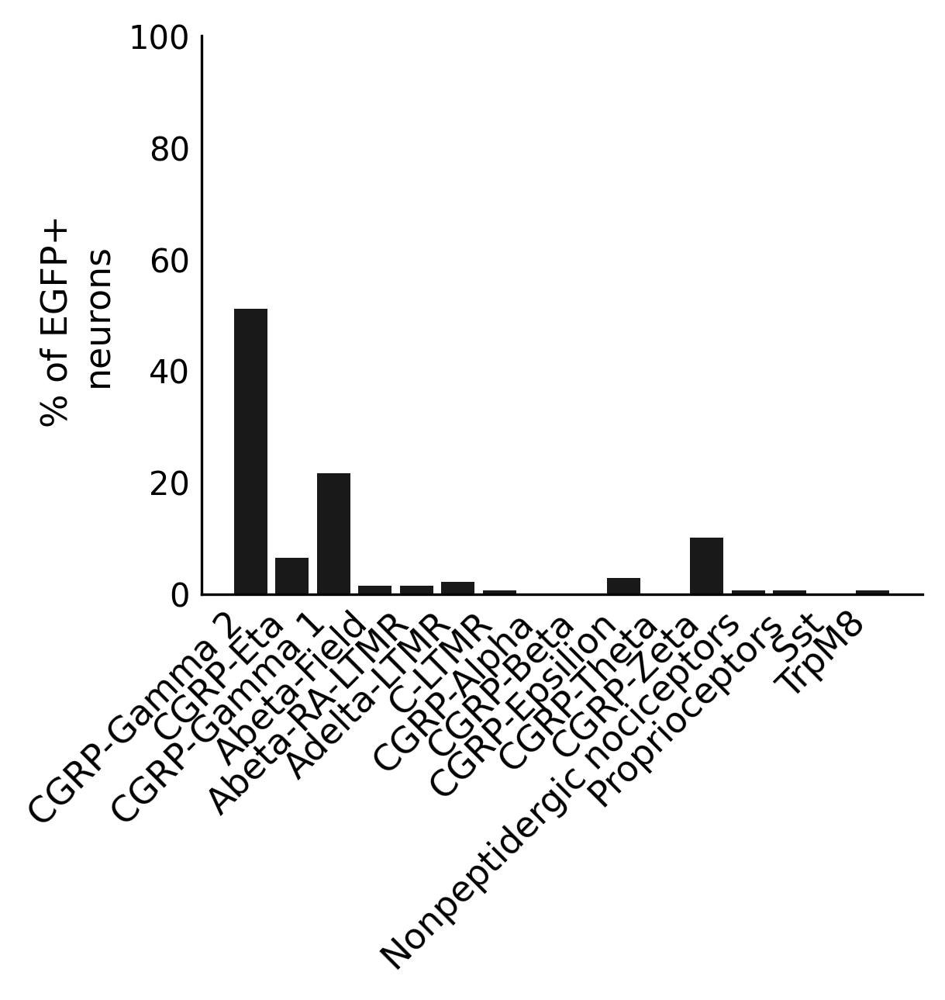

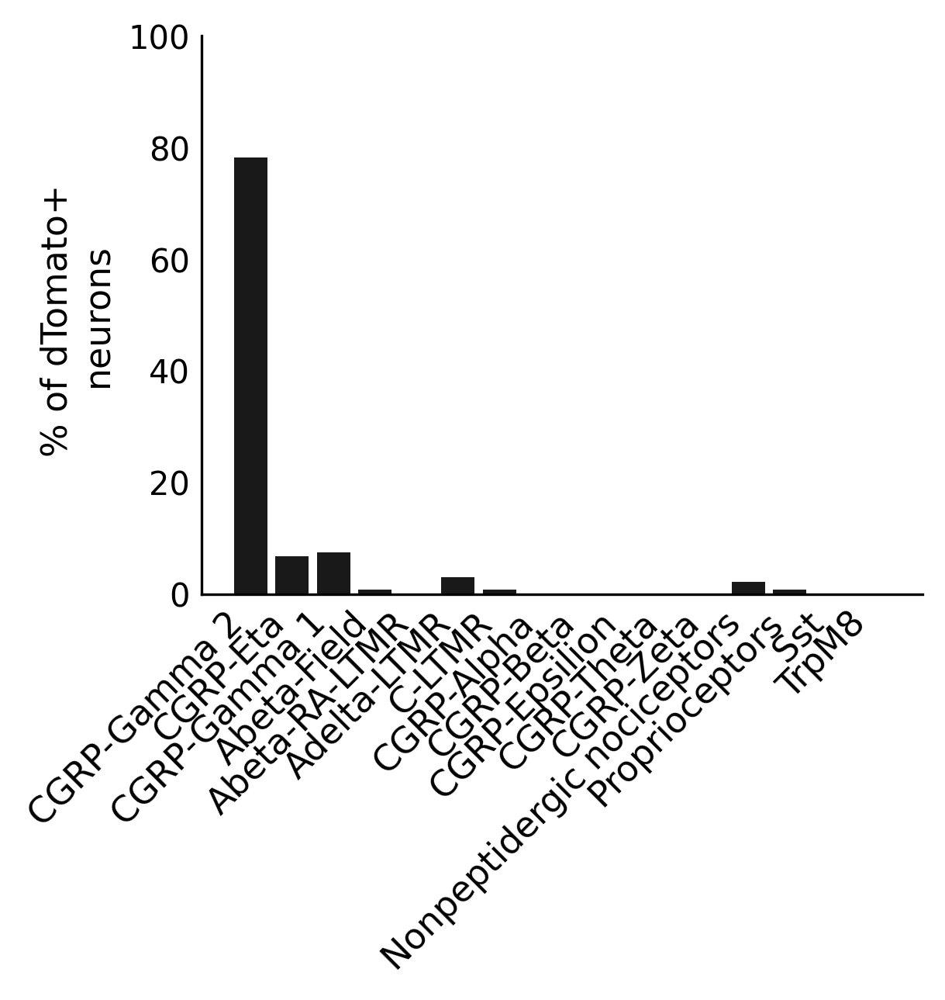

In [24]:
# set cell type order based on dual positive order

# make new temporary column
tmp = adata.copy()
tmp.obs['EGFP_single_positive'] = False
tmp.obs['dTomato_single_positive'] = False
tmp.obs.loc[tmp.obs['reporter_status']=='EGFP_Seq1_hi', 'EGFP_single_positive'] = True
tmp.obs.loc[tmp.obs['reporter_status']=='dTomato_Seq2_hi', 'dTomato_single_positive'] = True

barplot_dual_distribution(tmp,population_name = 'EGFP+',
                          label_col="EGFP_single_positive", plot_counts = False,
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "EGFP_distribution_percent_single_positive.pdf"), format='pdf', bbox_inches='tight')

barplot_dual_distribution(tmp,population_name = 'dTomato+',
                          label_col="dTomato_single_positive",plot_counts = False,
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "dTomato_distribution_percent_single_positive.pdf"), format='pdf', bbox_inches='tight')



### Save label and reporter csvs for upload to Xenium Explorer

In [25]:
label_cols = ["cell_id","sample_id","neuron_label","EGFP_Seq1_hi", "dTomato_Seq2_hi", "EGFP_dTomato_dual_hi", "reporter_status"]
label_df = adata.obs[label_cols]

In [26]:
# which samples contain dual+?
counts = label_df.value_counts(['sample_id', 'EGFP_dTomato_dual_hi'])
counts

sample_id  EGFP_dTomato_dual_hi
TMA00305   False                   3769
TMA00306   False                   3750
TMA00304   False                   3149
TMA00312   False                   1958
TMA00313   False                   1869
TMA00311   False                   1760
TMA00314   False                   1589
TMA00303   False                   1471
TMA00307   False                   1221
TMA00308   False                   1210
TMA00309   False                    325
TMA00310   False                    321
TMA00306   True                       5
TMA00305   True                       5
TMA00310   True                       2
TMA00312   True                       2
TMA00304   True                       2
TMA00307   True                       1
TMA00311   True                       1
TMA00313   True                       1
Name: count, dtype: int64

### Output csvs with neuron label

Add color column with hex codes from palette 

In [27]:
neuron_label_palette_mapped

{'Abeta-Field': '#1f77b4',
 'Abeta-RA-LTMR': '#aec7e8',
 'Adelta-LTMR': '#ff7f0e',
 'C-LTMR': '#ffbb78',
 'CGRP-Alpha': '#2ca02c',
 'CGRP-Beta': '#98df8a',
 'CGRP-Epsilion': '#d62728',
 'CGRP-Eta': '#ff9896',
 'CGRP-Gamma 1': '#9467bd',
 'CGRP-Gamma 2': '#c5b0d5',
 'CGRP-Theta': '#8c564b',
 'CGRP-Zeta': '#c49c94',
 'Nonpeptidergic nociceptors': '#e377c2',
 'Proprioceptors': '#f7b6d2',
 'Sst': '#7f7f7f',
 'TrpM8': '#c7c7c7'}

In [28]:
# for Xenium explorer, can only have one group
label_df_neuron_label = label_df.copy()
label_df_neuron_label['group'] = label_df_neuron_label['neuron_label']
label_df_neuron_label['color'] = label_df_neuron_label['group'].map(neuron_label_palette_mapped)
label_df_neuron_label= label_df_neuron_label[['cell_id','sample_id', 'group', 'color']]

# split to individual samples
for sample in adata.obs['sample_id'].unique().tolist():
    label_df_sample = label_df_neuron_label[label_df_neuron_label['sample_id']==sample]
    # save to csv
    label_df_sample.to_csv(os.path.join(output_dir, f"label_df_{sample}_neuron_label.csv"),index=False)

### Output csvs with reporter status

In [29]:
# for Xenium explorer, can only have one group
label_df_reporter = label_df.copy()
label_df_reporter['group'] = label_df_reporter['reporter_status']

# split to individual samples
for sample in adata.obs['sample_id'].unique().tolist():
    label_df_sample = label_df_reporter[label_df_reporter['sample_id']==sample]
    # save to csv
    label_df_sample.to_csv(os.path.join(output_dir, f"label_df_{sample}_reporter.csv"),index=False)

## Visualize CGRP gamma neuron subclustering

The CGRP-Gamma G1/G2 split was originally computed in `notebooks/03_neurons/03_split-cgrp-gamma.ipynb` and saved to `neurons-final-labels.h5ad`. Here we re-run the subclustering for visualization and generate `neuron_label_confirm` and verify it is consistent with the pre-computed `neuron_label` loaded from that file.

In [30]:
# 1. Subset to the CGRP-Gamma population
gamma_adata = adata[adata.obs['seurat_labels'] == 'CGRP-Gamma'].copy()

# 2. Use scVI latent space instead of PCA for neighbors
sc.pp.neighbors(gamma_adata, use_rep='X_scVI_seurat_neuron')
sc.tl.umap(gamma_adata)
sc.tl.leiden(gamma_adata, resolution=0.1, key_added='gamma_subclusters')

# 3. Identify G1 vs G2 based on Chrna3 mean expression
# Temporarily pull gene expression into .obs to allow grouping
gamma_adata.obs['Chrna3_temp'] = gamma_adata[:, 'Chrna3'].X.toarray().flatten()

cluster_expr = gamma_adata.obs.groupby('gamma_subclusters', observed=False)['Chrna3_temp'].mean()
# G2 = Chrna3-high cluster (idxmax), G1 = Chrna3-low cluster (idxmin)
g2_cluster = cluster_expr.idxmax()
g1_cluster = cluster_expr.idxmin()

/home/workspace/environment/sc-scvi/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/tmp/ipykernel_2297/3029829013.py:7: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(gamma_adata, resolution=0.1, key_added='gamma_subclusters')


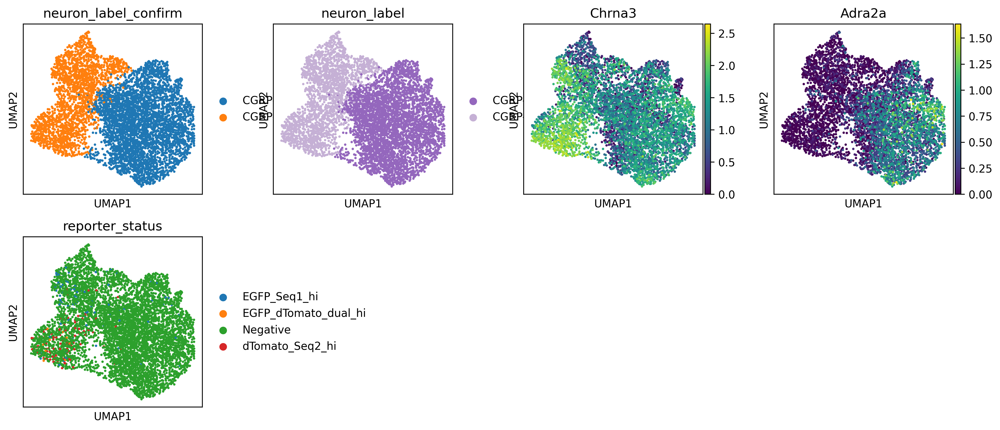

In [31]:
# Clean up the temporary column to avoid plotting conflicts
del gamma_adata.obs['Chrna3_temp']

# 4. Create the final labels
label_map = {g1_cluster: 'CGRP-Gamma 1', g2_cluster: 'CGRP-Gamma 2'}
gamma_adata.obs['neuron_label_confirm'] = gamma_adata.obs['gamma_subclusters'].map(label_map)

# 5. Visualize to confirm the split
sc.pl.umap(gamma_adata, color=['neuron_label_confirm', 'neuron_label', 'Chrna3', 'Adra2a', 'reporter_status'])

### Save CGRP visualizations

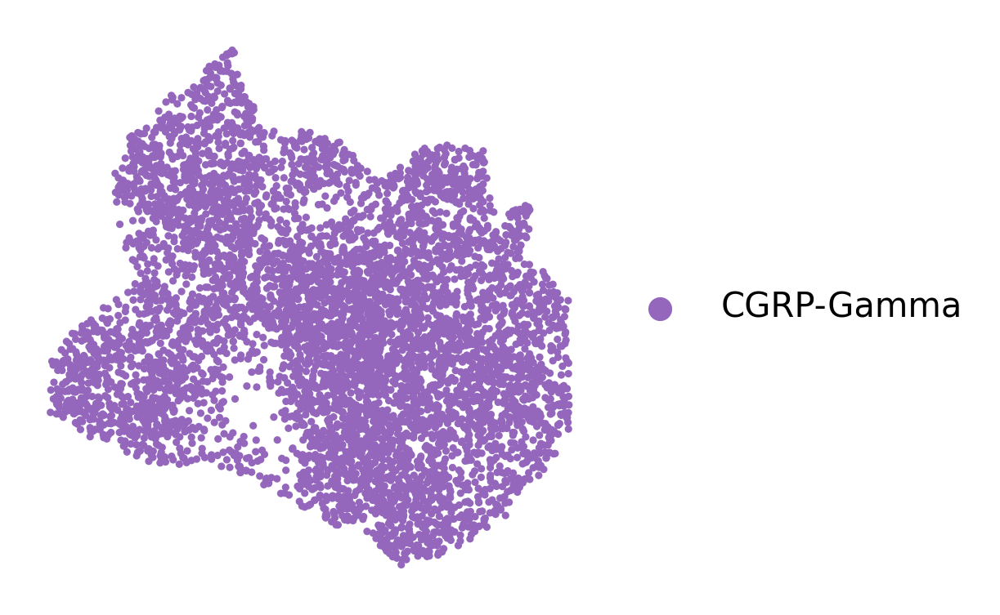

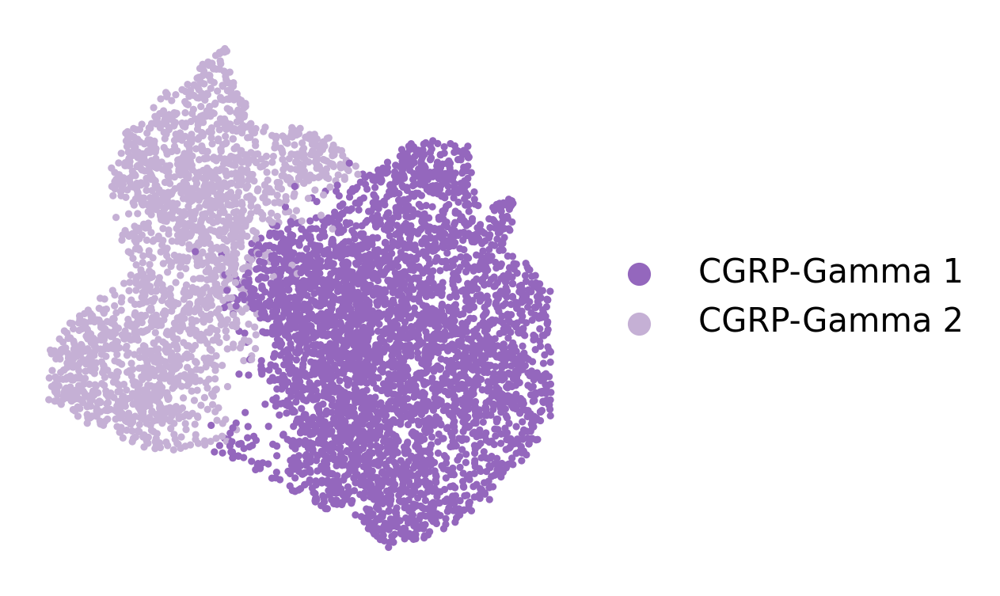

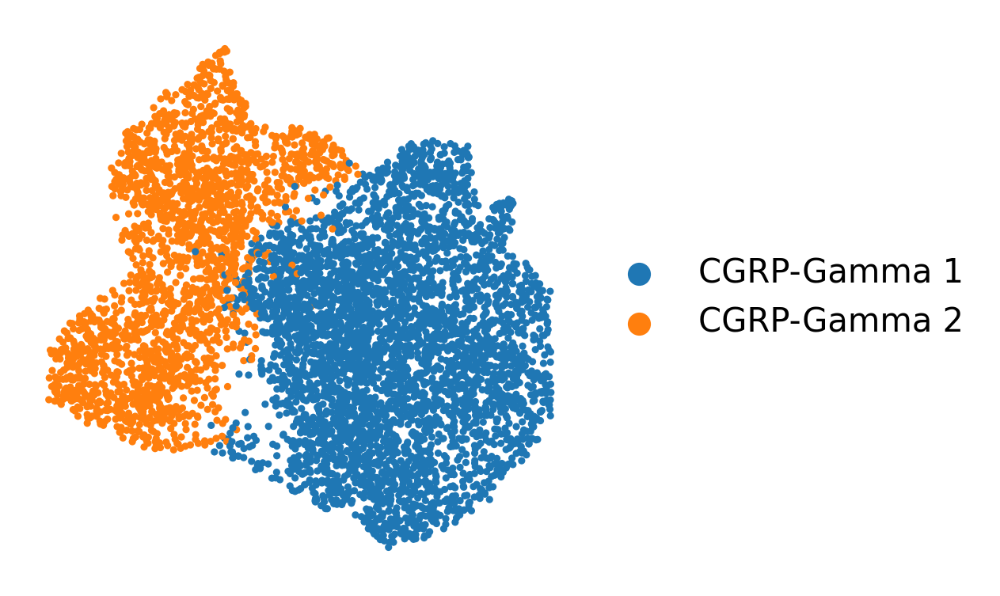

In [32]:
sc.pl.umap(gamma_adata, color='seurat_labels', frameon = False, title = '', show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_umap_all.pdf"), format='pdf', bbox_inches='tight')

sc.pl.umap(gamma_adata, color='neuron_label', frameon = False, title = '', show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_neuron_label.pdf"), format='pdf', bbox_inches='tight')

sc.pl.umap(gamma_adata, color='neuron_label', frameon = False, title = '', palette = ['#1f77b4', '#ff7f0e'], show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_neuron_label_blue_orange.pdf"), format='pdf', bbox_inches='tight')



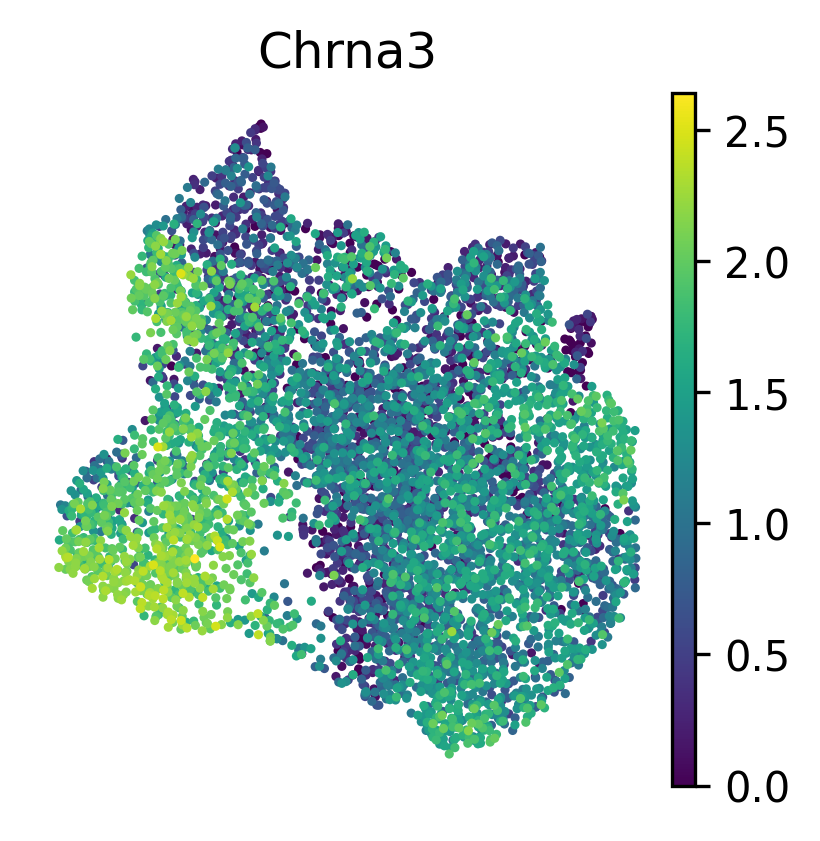

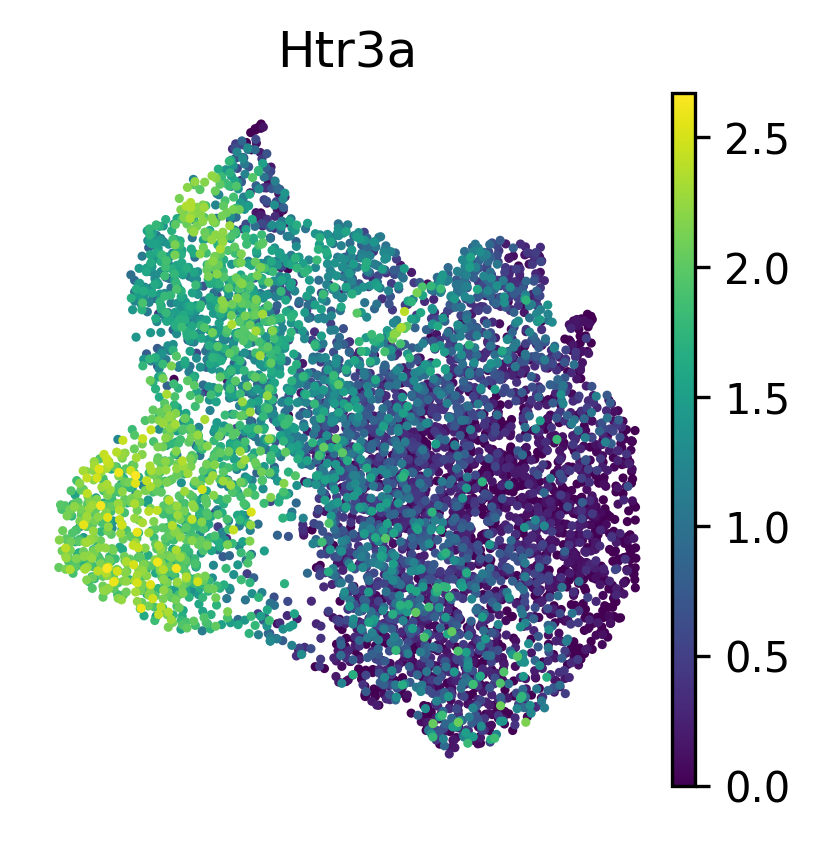

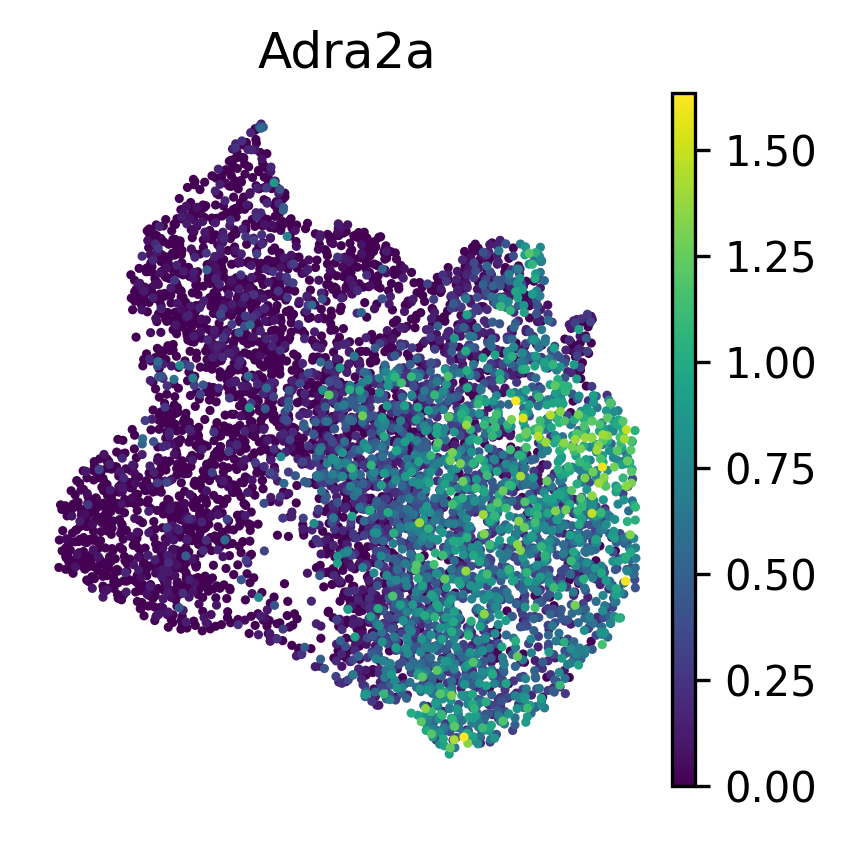

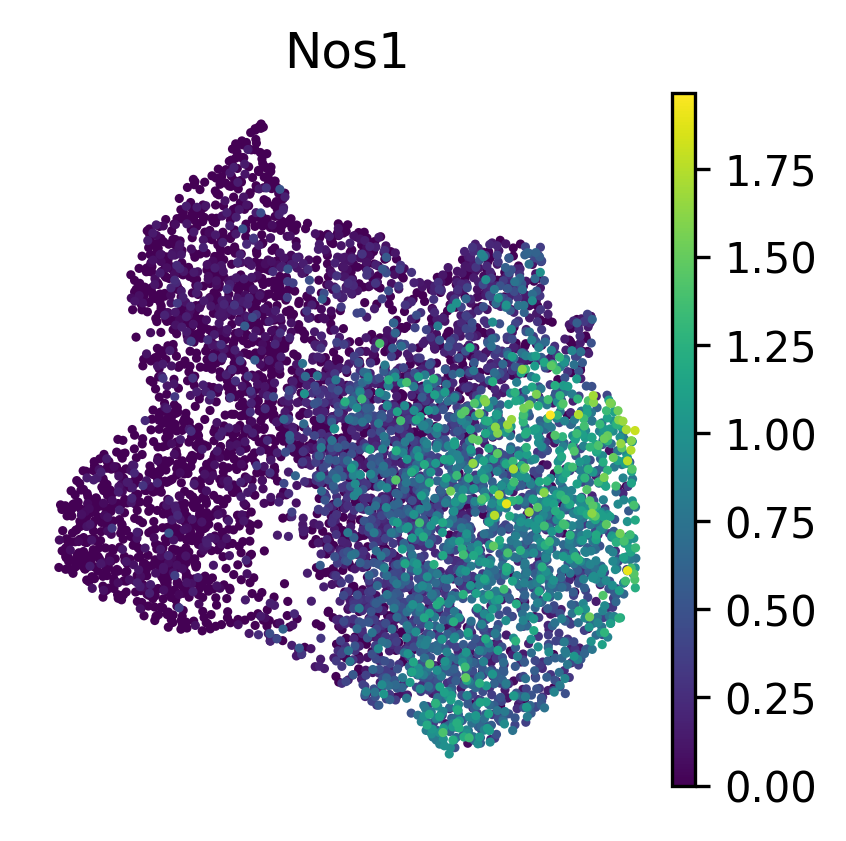

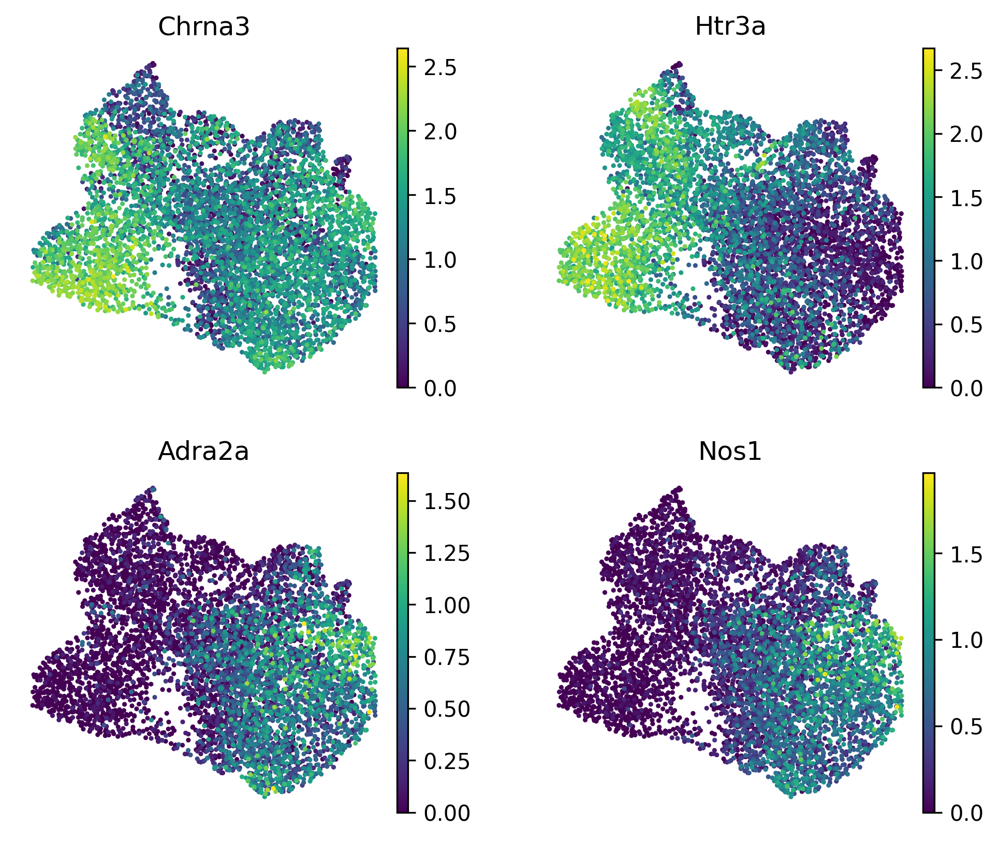

In [33]:
sc.pl.embedding(gamma_adata, basis = 'X_umap', color='Chrna3', cmap = 'viridis', frameon = False, show = False)
plt.savefig(os.path.join(plot_out_dir, "CGRP_Chrna3.pdf"), format='pdf', bbox_inches='tight')

sc.pl.embedding(gamma_adata, basis = 'X_umap', color='Htr3a', cmap = 'viridis', frameon = False, show = False)
plt.savefig(os.path.join(plot_out_dir, "CGRP_Htr3a.pdf"), format='pdf', bbox_inches='tight')

sc.pl.embedding(gamma_adata, basis = 'X_umap', color='Adra2a', cmap = 'viridis', frameon = False, show = False)
plt.savefig(os.path.join(plot_out_dir, "CGRP_Adra2a.pdf"), format='pdf', bbox_inches='tight')

sc.pl.embedding(gamma_adata, basis = 'X_umap', color='Nos1', cmap = 'viridis', frameon = False, show = False)
plt.savefig(os.path.join(plot_out_dir, "CGRP_Nos1.pdf"), format='pdf', bbox_inches='tight')

sc.pl.embedding(gamma_adata, basis = 'X_umap', color=['Chrna3','Htr3a','Adra2a','Nos1'], cmap = 'viridis', ncols = 2, frameon = False, show = False)
plt.savefig(os.path.join(plot_out_dir, "CGRP_all4genes.pdf"), format='pdf', bbox_inches='tight')

### Proportions bar plots

In [34]:
def plot_dual_fraction_among_dtom(
    adata,
    dtom_col="dTomato_Seq2_hi",
    label_col="EGFP_dTomato_dual_hi",
    mode="counts",  # Options: "counts" or "percent"
    colors=None,
    figsize=(3, 3)
):
    import seaborn as sns

    # 1. Logic for colors and masks (same as before)
    if colors is None:
        colors = {"Single": "crimson", "Dual": "gold"}

    dtom_mask = adata.obs[dtom_col].astype(bool)
    dual_mask = adata.obs[label_col].astype(bool)

    n_dtom_total = dtom_mask.sum()
    n_dual = (dtom_mask & dual_mask).sum()
    n_dtom_only = n_dtom_total - n_dual

    # 2. Switch between Counts and Percent
    if mode == "percent":
        values = [(n_dtom_only / n_dtom_total * 100), (n_dual / n_dtom_total * 100)]
        ylabel = "Percent of dTom+ cells"
        fmt = ".1f" # Format for labels
        suffix = "%"
    else:
        values = [n_dtom_only, n_dual]
        ylabel = "Number of cells"
        fmt = "d" # Format for labels (integer)
        suffix = ""

    categories = ["dTom-only", "Dual+"]
    plot_colors = [colors["Single"], colors["Dual"]]

    # 3. Plotting
    plt.figure(figsize=figsize)
    bars = plt.bar(categories, values, color=plot_colors, edgecolor="black")

    # 4. Add dynamic labels on top of bars
    for bar, val in zip(bars, values):
        # We still show both raw and % in the text label for clarity
        raw_val = n_dtom_only if bar.get_x() < 0.5 else n_dual
        perc = (raw_val / n_dtom_total * 100)

        plt.text(
            bar.get_x() + bar.get_width()/2,
            val,
            f"{raw_val}\n({perc:.1f}%)",
            ha="center", va="bottom", fontsize=10
        )

    plt.ylabel(ylabel)

    sns.despine() # Remove top and right box
    plt.tight_layout()
    # plt.show()

    return {"fraction_dual": n_dual / n_dtom_total}

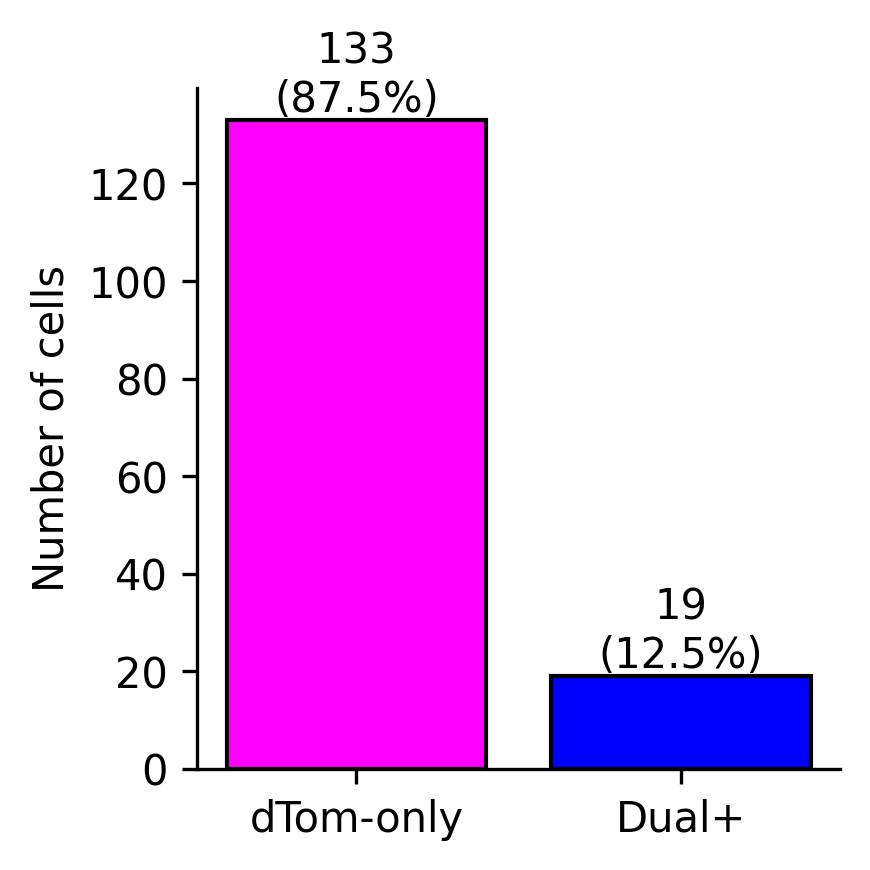

In [35]:
stats = plot_dual_fraction_among_dtom(
    adata,
    colors={
        "Single": "magenta",
        "Dual": "blue"
    }
)
plt.savefig(os.path.join(plot_out_dir, "dtomato_percent_dual_counts.pdf"), format='pdf', bbox_inches='tight')

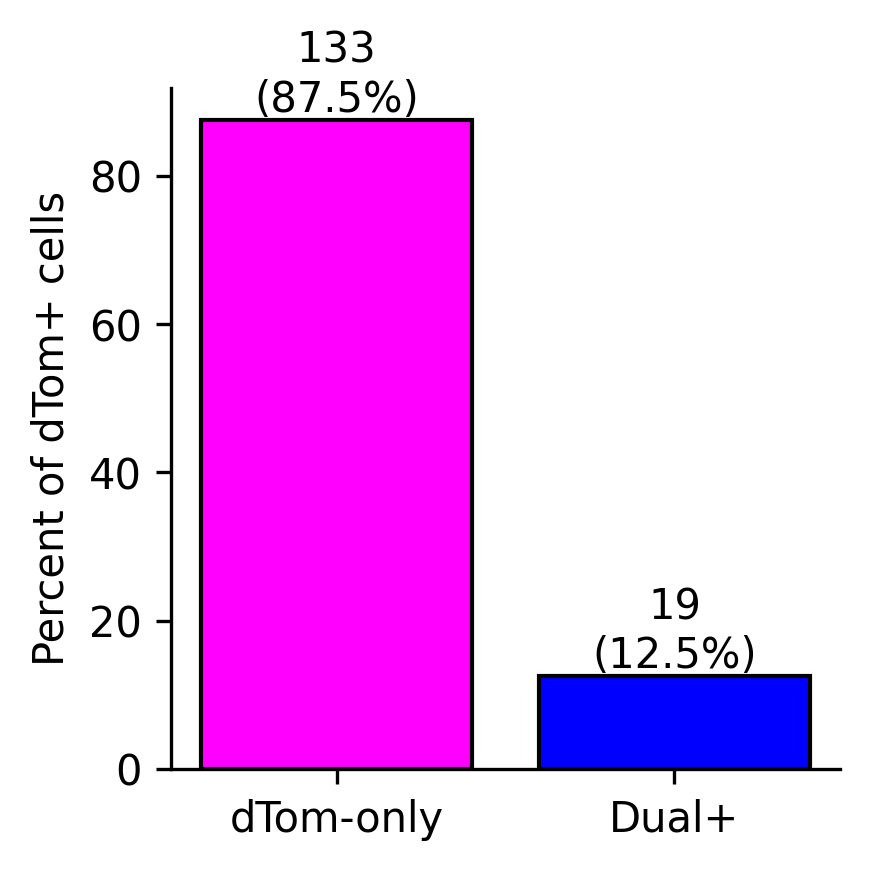

In [36]:
stats = plot_dual_fraction_among_dtom(
    adata,
    mode='percent',
    colors={
        "Single": "magenta",
        "Dual": "blue"
    }
)
plt.savefig(os.path.join(plot_out_dir, "dtomato_percent_dual_percent.pdf"), format='pdf', bbox_inches='tight')